<h1 align='center'> Estimation of Obesity levels </h1>
<h4 align='center'> Based on Eating Habits and Physical Condition </h4> 


## 0. Import relevant Dependencies

Incase you are getting any error saying the package is not installed while running the below cell, then you can use two methods:
- pip install ________.
- google 'How to install ________'.

In [1]:
# Import Dependencies -To see the graphs in the notebook.
%matplotlib inline   

# Python Imports
import math,time,random,datetime

# Data Manipulation
import numpy as np
import pandas as pd

# Visualization -This is where the graphs come in.
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

# Preprocessing
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn import model_selection, tree, preprocessing, metrics, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

## 1. Loading the required Data

In [2]:
# Import and View the data.
df = pd.read_csv('Obesity.csv')
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


- Since our predictor variable is categorical here we shall create a new column to undestand a bit more about our Label. This column is called the Body Mass Index (BMI).

In [3]:
df['BMI'] = df['Weight']/(df['Height']**2)
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight,24.386526
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight,24.238227
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight,23.765432
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I,26.851852
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II,28.342381


In [4]:
print("Dimensionality of the dataset: ", df.shape)

Dimensionality of the dataset:  (2111, 18)


## 2. Exploratory Data Analysis

**PROBLEM: ** To predict Obesity levels of individuals.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [6]:
# Describing all the Numerical Features
df.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,BMI
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866,29.700159
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927,8.011337
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000,12.998685
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000,24.325802
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350,28.719089
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000,36.016501
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000,50.811753


In [7]:
# Describing all the Categorical Features
df.describe(include=['O'])

,Gender,family_history_with_overweight,FAVC,CAEC,SMOKE,SCC,CALC,MTRANS,NObeyesdad
count,2111,2111,2111,2111,2111,2111,2111,2111,2111
unique,2,2,2,4,2,2,4,5,7
top,Male,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_I
freq,1068,1726,1866,1765,2067,2015,1401,1580,351


<AxesSubplot:>

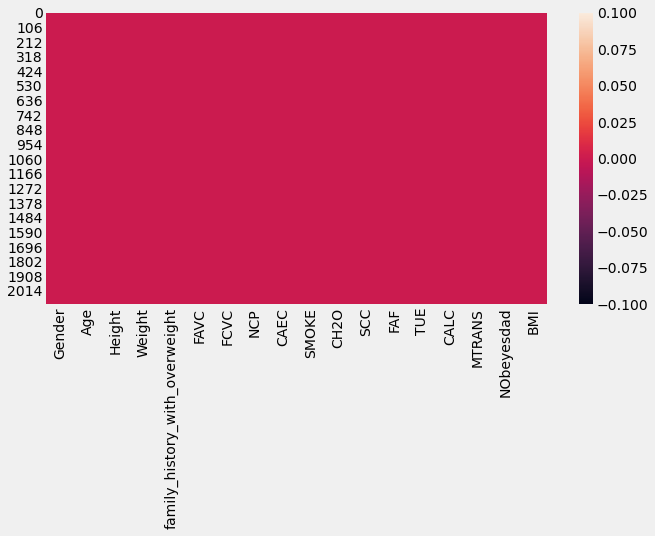

In [8]:
# To understand Missing values
plt.figure(figsize= (10,5))
sns.heatmap(df.isnull())

- It is important to visualise missing values, because then you will know what are the major NaN values in your dataset.
- Here we can see that there are no missing values. This makes our work much more easier.

In [9]:
# To get the Percentage of missing values.
np.round(((df.isnull().sum())/len(df))*100,2)

Gender                            0.0
Age                               0.0
Height                            0.0
Weight                            0.0
family_history_with_overweight    0.0
FAVC                              0.0
FCVC                              0.0
NCP                               0.0
CAEC                              0.0
SMOKE                             0.0
CH2O                              0.0
SCC                               0.0
FAF                               0.0
TUE                               0.0
CALC                              0.0
MTRANS                            0.0
NObeyesdad                        0.0
BMI                               0.0
dtype: float64

### What Datatypes are there in the dataframe?

We usually consider features with a datatype of object as categorical features. And those with float or int could be numerical features.

However, sometimes the features that we consider as numerical might actually turn out to be categorical.

The next few steps will help us figure out how to process our data so our machine learning model can learn from it.
Ideally all the features will be encoded into a numerical value of some kind (maybe 0 or 1 / something else).

In [10]:
# Datatypes in the dataset
df.dtypes

Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
BMI                               float64
dtype: object

Since we can see that there are no missing values in our dataset, rather than the usual Univariate and Bivariate analysis we will be going to do a quick EDA. 
- For this purpose we will be introducing a new concept called **Profile Report**. This is obtained from ***pandas_profiling*** which is a library which is useful in streamlining Exploratory Data Analysis.

> **NOTE:** I am going for this method because of the lack of time available. Whoever is viewing this notebook can do the analysis is a more elaborate manner.

In [11]:
from pandas_profiling import ProfileReport

In [12]:
prof = ProfileReport(df)
prof

Render HTML: 100%|██████████| 1/1 [00:32<00:00, 32.82s/it]


## 3. Start Building Maching Learning Models

Before running a ML model our aim was to turn all values to numbers. We will now run a series of machine learning algorithm to see which will yield the best results.

### Simple Linear Regression (***Weight vs BMI***)

In [13]:
df_W = df[['Weight', "BMI"]]

In [14]:
df_W.describe()

,Weight,BMI
count,2111.000000,2111.000000
mean,86.586058,29.700159
std,26.191172,8.011337
min,39.000000,12.998685
25%,65.473343,24.325802
50%,83.000000,28.719089
75%,107.430682,36.016501
max,173.000000,50.811753


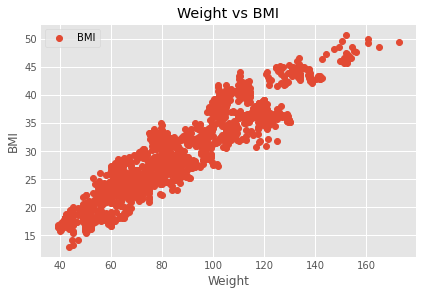

In [15]:
plt.style.use('ggplot')
df_W.plot(x= 'Weight', y= 'BMI',style='o')
plt.title('Weight vs BMI')
plt.xlabel('Weight')
plt.ylabel('BMI')
plt.show()

In [16]:
X= df_W.drop('BMI',axis=1)
y= df_W['BMI']

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 33)

In [18]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [19]:
print(regressor.intercept_)

5.0236867825309375


> The intercept (often labeled the constant) is the expected mean value of Y when all X=0. In a purely mathematical sense, this definition is correct. Unfortunately, it’s frequently impossible to set all variables to zero because this combination can be an impossible or irrational arrangement.

In [20]:
y_pred = regressor.predict(X_test)

In [21]:
dw = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
dw

,Actual,Predicted
1065,27.087800,27.753507
401,24.485652,28.321753
1971,42.973179,45.345764
573,17.301038,19.229825
1354,34.162773,33.306600
...,...,...
1990,41.982849,36.505374
1580,38.249760,39.285885
1627,36.859454,36.092233
914,26.713254,24.759836


<AxesSubplot:xlabel='BMI'>

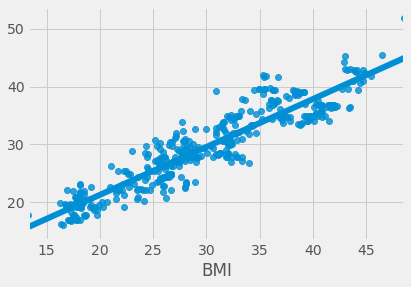

In [22]:
plt.style.use('fivethirtyeight')
sns.regplot(y_test, y_pred)

- The above graph shows our model is predicting good results.

In [23]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 2.377555800577136
Mean Squared Error: 8.796752277883975
Root Mean Squared Error: 2.9659319408718696


- root mean squared error is 2.96, which is less than 10% of the mean of BMI of all the individuals i.e. 29.700159. This means that our algorithm did a decent job.

In [24]:
import statsmodels.api as sm
X_test_SLR= sm.add_constant(X_test)

X_test_SLR= sm.add_constant(X_test)
ls=sm.OLS(y_test,X_test_SLR).fit()
print(ls.summary())

                            OLS Regression Results                            
Dep. Variable:                    BMI   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     2585.
Date:                Fri, 05 Feb 2021   Prob (F-statistic):          8.39e-182
Time:                        23:39:46   Log-Likelihood:                -1054.9
No. Observations:                 423   AIC:                             2114.
Df Residuals:                     421   BIC:                             2122.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.4628      0.516      8.647      0.0

### Multiple Linear Regression

In [25]:
X = df[['Age', 'Height', 'Weight', 'Gender', 'family_history_with_overweight', 'SMOKE', 'CALC', 'MTRANS']]

In the above data frame, we have Gender, family_history_with_overweight, SMOKE, CALC,and MTRANS as a categorical variable, so we need to add dummy variables instead.

#### What are the benefits of a Dummy Variable?
Regression results are easiest to interpret when dummy variables are limited to two specific values, 1 or 0. Typically, 1 represents the presence of a qualitative attribute, and 0 represents the absence.

In [26]:
X = pd.get_dummies(data= X, drop_first= True)
X.head()

,Age,Height,Weight,Gender_Male,family_history_with_overweight_yes,SMOKE_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,21.0,1.62,64.0,0,1,0,0,0,1,0,0,1,0
1,21.0,1.52,56.0,0,1,1,0,1,0,0,0,1,0
2,23.0,1.80,77.0,1,1,0,1,0,0,0,0,1,0
3,27.0,1.80,87.0,1,0,0,1,0,0,0,0,0,1
4,22.0,1.78,89.8,1,0,0,0,1,0,0,0,1,0


- Here we have added the dummy variable in the form of 0 and 1, which is easy to interpret for the regression model.

In [27]:
Y = df['BMI']

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=101)

After splitting the dataset into a test and train we will be importing the Linear Regression model.

In [29]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [30]:
# print the intercept
print(model.intercept_)

56.618226510037175


> The intercept (often labeled the constant) is the expected mean value of Y when all X=0. In a purely mathematical sense, this definition is correct. Unfortunately, it’s frequently impossible to set all variables to zero because this combination can be an impossible or irrational arrangement.

In [31]:
coeff_parameter = pd.DataFrame(model.coef_,X.columns,columns=['Coefficient'])
coeff_parameter

,Coefficient
Age,0.000338
Height,-33.234856
Weight,0.337179
Gender_Male,0.089313
family_history_with_overweight_yes,0.676718
SMOKE_yes,-0.478480
CALC_Frequently,0.035279
CALC_Sometimes,-0.060437
CALC_no,0.025158
MTRANS_Bike,0.328970


The sign of each coefficient indicates the direction of the relationship between a predictor variable and the response variable.
- ***A positive sign indicates that as the predictor variable increases, the Target variable also increases.***
- ***A negative sign indicates that as the predictor variable increases, the Target variable decreases.***

In [32]:
predictions = model.predict(X_test)

In [33]:
overall = pd.DataFrame({'Actual': y_test, 'Predicted': predictions, 'Residual': (y_test-predictions)})
overall

,Actual,Predicted,Residual
856,25.689967,25.778226,-0.088259
55,21.967120,21.725437,0.241683
1695,38.040971,38.365148,-0.324177
1320,32.120312,32.661788,-0.541476
2077,46.027679,47.727872,-1.700194
...,...,...,...
1635,35.742416,36.596217,-0.853801
1024,27.756987,27.696873,0.060114
1181,27.615704,27.518541,0.097164
608,17.321967,17.523977,-0.202011


### Normality Test

To check if the residuals follow Normal distribution.

<AxesSubplot:>

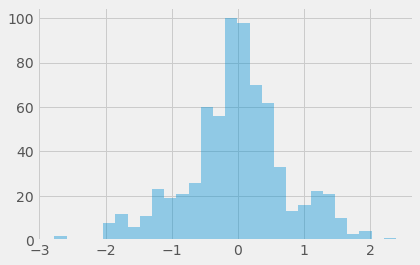

In [34]:
sns.distplot(x= overall['Residual'], kde= False)

<AxesSubplot:xlabel='BMI'>

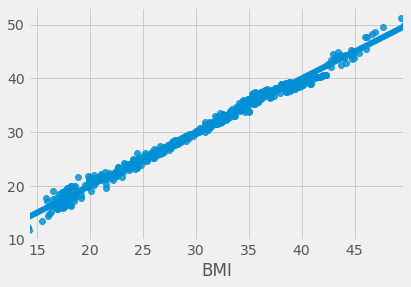

In [35]:
sns.regplot(y_test,predictions)

The above graph shows our model is predicting good results. lets see Rsquare value

In [36]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Mean Absolute Error: 0.5600553707515595
Mean Squared Error: 0.5696060209328113
Root Mean Squared Error: 0.7547224794139972


In [37]:
X_test_Sm= sm.add_constant(X_test)

X_test_Sm= sm.add_constant(X_test)
ls=sm.OLS(y_test,X_test_Sm).fit()
print(ls.summary())

                            OLS Regression Results                            
Dep. Variable:                    BMI   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     5297.
Date:                Fri, 05 Feb 2021   Prob (F-statistic):               0.00
Time:                        23:40:02   Log-Likelihood:                -785.04
No. Observations:                 697   AIC:                             1598.
Df Residuals:                     683   BIC:                             1662.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

#### What Are the Adjusted R-squared?

We Use adjusted R-squared to compare the goodness-of-fit for regression models that contain different numbers of independent variables.

Let’s say you are comparing a model with five independent variables to a model with one variable and the five variable model has a higher R-squared. Is the model with five variables actually a better model, or does it just have more variables? To determine this, just compare the adjusted R-squared values!